In [1]:

import samplerate
#from tensorflow import keras
import keras
from keras import losses
from keras.callbacks import EarlyStopping
from keras.optimizers import adam
import random
import numpy as np
import matplotlib.pyplot as plt 
from numpy import array, hstack, unique, where
import statsmodels.api as sm 
import pickle
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from keras.metrics import MeanAbsolutePercentageError

import os
import sys
os.environ["CUDA_VISIBLE_DEVICES"]="0"
sys.path.insert(1,'/home/jgozlan/GIT/scripts/')
sys.path.insert(1, '/home/jgozlan/GIT/models_analysis/')
import tensorflow as tf
tf.test.is_gpu_available()

from imu_extractor import get_all_dataframes_for_forecasting, get_freq_magn, transform_dataset_into_freq_magn
from train_test_split_multi import get_train_test_split
from baseline import find_frequency,repeat_period_forecast_acf, get_mean_line_forecast, get_flat_line_forecast, get_acf_peak
from models import create_lstm_encoder_decoder,create_dropout_predict_function
from evaluation2 import  plot_metrics, plot_forecasts, get_metrics_for_forecast



Using TensorFlow backend.


True

In [4]:

path_cluster0 = ['Run_Features']

path_cluster1 = ['CarDriving_Features']

path_cluster2 = ['Karting_Features',
                 'MotorcycleHelmet_Features',
                 'Scooter_Features','SkateboardChesty_Features',
                 'SnowboardSeeker_Features','Hiking_Features']

path_all_classes = path_cluster0 + path_cluster1 + path_cluster2

recording_freq = 6400.0
downsampling_freq = 200.0

all_dfs_classes = []

for i,c in enumerate(path_cluster0):
    dfs = get_all_dataframes_for_forecasting("Database/" + c, recording_freq, downsampling_freq)
    all_dfs_classes.append(dfs)
    
all_df = [item for sublist in all_dfs_classes for item in sublist]

GH010029.MP4.eis_dump.bin_features.json
GH010011.MP4.eis_dump.bin_features.json
GH019983.MP4.eis_dump.bin_features.json
GH010019.MP4.eis_dump.bin_features.json
GH010030.MP4.eis_dump.bin_features.json
GH010028.MP4.eis_dump.bin_features.json
GH019982.MP4.eis_dump.bin_features.json
GH010012.MP4.eis_dump.bin_features.json
GH019973.MP4.eis_dump.bin_features.json


In [5]:
lag = 500
ahead = 100
delay = 5
test_size = 0.2
dim = 12
target_index = [0,1,2]
classification = False

X_train, y_train, X_test, y_test = get_train_test_split(all_df, test_size, lag, ahead, delay, target_index, classification = False)

In [9]:


def get_acf_for_signal(input_, lag):

    acf = sm.tsa.acf(input_, nlags = lag) 
    inflection = np.diff(np.sign(np.diff(acf)))
    peaks = (inflection < 0).nonzero()[0] + 1
    acf_peaks = np.argsort(-1*acf[peaks])
    acf_peaks_sorted = acf[peaks][acf_peaks]
    if len(acf_peaks_sorted) > 0:
        return acf_peaks_sorted[0]
    else:
        return 0

def get_acf_for_signals(inputs, lag):

    x_gyro = inputs[:,0]
    y_gyro = inputs[:,1]
    z_gyro = inputs[:,2]

    x_peak = get_acf_for_signal(x_gyro, lag)
    y_peak = get_acf_for_signal(y_gyro, lag)
    z_peak = get_acf_for_signal(z_gyro, lag)

    return x_peak, y_peak, z_peak

acf_peaks_gyro_X_test = np.zeros((X_test.shape[0],3))
for i, x in enumerate(X_test):
    if i % 10000 == 0 :
        print(i)
    acf_peaks_gyro_X_test[i] = get_acf_for_signals(x, lag)



0


In [10]:
# transform the time domain representation of the sequence in the frequency domain 

num_freq = 12 # number of harmonics

transformed_X_train = transform_dataset_into_freq_magn(X_train, downsampling_freq, num_freq)
transformed_X_test = transform_dataset_into_freq_magn(X_test, downsampling_freq, num_freq)

freq_dim_in = transformed_X_train.shape[1]

In [11]:
running_forecasting_model = keras.models.load_model('models_analysis/cluster0_forecasting_multi_5step', custom_objects={"MeanAbsolutePercentageError":MeanAbsolutePercentageError()}, compile= False)

lda_model = pickle.load(open('models_analysis/lda_model.sav', 'rb'))
kmeans_model = pickle.load(open('models_analysis/kmeans_model.sav', 'rb'))
gmm_model = pickle.load(open('models_analysis/gmm_model.sav', 'rb'))


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [11]:
# create dropout version of the network for confidence interval inference
# must put a really low dropout
dropout = 0.05
predict_with_dropout = create_dropout_predict_function(running_forecasting_model, dropout)

forecast = running_forecasting_model.predict(X_test)

forecast_x = forecast[:,:,0].reshape((forecast.shape[0],forecast.shape[1]))
forecast_y = forecast[:,:,1].reshape((forecast.shape[0],forecast.shape[1]))
forecast_z = forecast[:,:,2].reshape((forecast.shape[0],forecast.shape[1]))


In [21]:
# compute stats for pred with dropout

def get_mean_std_ci_from_pred(pred_with_dropout, input_pred, num_iter = 30, ci = 0.8):
    
    predictions = np.zeros((num_iter, ahead,3))

    for i in range(num_iter):
        pred = pred_with_dropout((input_pred ,1.0))
        predictions[i,:] = pred[0].reshape((1,ahead,3))

    means_x = predictions[:,:,0].reshape((-1,100)).mean(axis=0)
    means_y = predictions[:,:,1].reshape((-1,100)).mean(axis=0)
    means_z = predictions[:,:,2].reshape((-1,100)).mean(axis=0)

    sds_x = predictions[:,:,0].reshape((-1,100)).std(axis=0)
    sds_y = predictions[:,:,1].reshape((-1,100)).std(axis=0)
    sds_z = predictions[:,:,2].reshape((-1,100)).std(axis=0)


    lows_x = np.quantile(predictions[:,:,0], 0.5- ci /2, axis=0)
    uppers_x = np.quantile(predictions[:,:,0], 0.5+ ci /2, axis=0)

    lows_y = np.quantile(predictions[:,:,1], 0.5- ci /2, axis=0)
    uppers_y = np.quantile(predictions[:,:,1], 0.5+ ci /2, axis=0)

    lows_z = np.quantile(predictions[:,:,2], 0.5- ci /2, axis=0)
    uppers_z = np.quantile(predictions[:,:,2], 0.5+ ci /2, axis=0)
    
    means = [means_x, means_y, means_z]
    sds = [sds_x, sds_y, sds_z]
    lows = [lows_x, lows_y, lows_z]
    uppers = [uppers_x, uppers_y, uppers_z]

    return means, sds, lows, uppers



In [14]:
# 

def plot_metrics_for_threshold(metrics_threshold, metrics_global):
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,4))

    for i, ax in enumerate(axs.flatten()):  
        ax.plot(range(ahead), metrics_global[i], label = "global")
        for threshold in range(90,100,1):
            ax.plot(range(ahead), metrics_threshold[i][threshold], label = threshold)
        ax.legend(loc="upper left")

    plt.show()

In [15]:
# plot a few examples, with their associated confidence interval with dropout
def plot_examples_test(indexes, X_true, Y_true, forecast, k):
    
    random_indexes = random.sample(indexes, k)

    print(random_indexes)
    for i in random_indexes:

        means, sds, lows, highs = get_mean_std_ci_from_pred(predict_with_dropout, X_true[i].reshape((1, lag, 12)), num_iter = 30, ci = 0.95)
        
        fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,4))
        
        x_input = X_true[i][:,0].reshape((lag,-1))
        y_input = X_true[i][:,1].reshape((lag,-1))
        z_input = X_true[i][:,2].reshape((lag,-1))

        x_true = Y_true[i][:,0].reshape((ahead,-1))
        y_true = Y_true[i][:,1].reshape((ahead,-1))
        z_true = Y_true[i][:,2].reshape((ahead,-1))

        x_forecast = forecast[i][:,0].reshape((ahead,-1))
        y_forecast = forecast[i][:,1].reshape((ahead,-1))
        z_forecast = forecast[i][:,2].reshape((ahead,-1))

        t = [len(x_input) + j for j in range(len(x_true))]
        #print(t)

        inputs = [x_input, y_input,z_input]
        outputs = [x_true , y_true , z_true]
        forecasts = [x_forecast, y_forecast, z_forecast]

        signal_labels = ['x_gyro signal', 'y_gyro_input signal','z_gyro signal']
        signal_colors = ['red','green','blue']

        forecast_labels = ['x_gyro forecast', 'y_gyro forecast','z_gyro forecast']
        forecast_colors = ['orange','lime','cyan']
        

        for j, ax in enumerate(axs.flatten()):
            ax.plot(range(lag, lag +ahead,1), means[j], label = "dropout", color = 'b')
            ax.fill_between(range(lag, lag +ahead,1), lows[j], highs[j], color='b', label = 'cf', alpha=.1)
            ax.plot(range(len(inputs[j])), inputs[j], label = signal_labels[j], color = signal_colors[j])
            ax.plot(t, outputs[j], color = signal_colors[j])
            ax.plot(t, forecasts[j], label = forecast_labels[j], color = forecast_colors[j])
            ax.legend(loc="upper left")
        

        plt.show()


In [16]:
values_to_test = 100

mae_threshold_x_l = np.zeros((values_to_test,ahead))
mae_threshold_y_l = np.zeros((values_to_test,ahead))
mae_threshold_z_l = np.zeros((values_to_test,ahead))

mse_threshold_x_l = np.zeros((values_to_test,ahead))
mse_threshold_y_l = np.zeros((values_to_test,ahead))
mse_threshold_z_l = np.zeros((values_to_test,ahead))

mae_threshold_x_b = np.zeros((values_to_test,ahead))
mae_threshold_y_b = np.zeros((values_to_test,ahead))
mae_threshold_z_b = np.zeros((values_to_test,ahead))

mse_threshold_x_b = np.zeros((values_to_test,ahead))
mse_threshold_y_b = np.zeros((values_to_test,ahead))
mse_threshold_z_b = np.zeros((values_to_test,ahead))

mae_threshold_x_h = np.zeros((values_to_test,ahead))
mae_threshold_y_h = np.zeros((values_to_test,ahead))
mae_threshold_z_h = np.zeros((values_to_test,ahead))

mse_threshold_x_h = np.zeros((values_to_test,ahead))
mse_threshold_y_h = np.zeros((values_to_test,ahead))
mse_threshold_z_h = np.zeros((values_to_test,ahead))

mae_x_g = np.zeros((1,ahead))
mae_y_g = np.zeros((1,ahead))
mae_z_g = np.zeros((1,ahead))

mse_x_g = np.zeros((1,ahead))
mse_y_g = np.zeros((1,ahead))
mse_z_g = np.zeros((1,ahead))

# GET THE THREE AXIS ACF PERIODICITY METRIC 
x_gyro_acf = np.mean(acf_peaks_gyro_X_test, axis = 1)

mae_x, mse_x, mape_x, smape_x = get_metrics_for_forecast(y_test[:,:,0].reshape((-1,ahead)), forecast_x)
mae_y, mse_y, mape_y, smape_y = get_metrics_for_forecast(y_test[:,:,1].reshape((-1,ahead)), forecast_y)
mae_z, mse_z, mape_z, smape_z = get_metrics_for_forecast(y_test[:,:,2].reshape((-1,ahead)), forecast_z)
    
mae_x_g = mae_x
mae_y_g = mae_y
mae_z_g = mae_z

mse_x_g = mse_x
mse_y_g = mse_y
mse_z_g = mse_z


for threshold in range(0,values_to_test,1):

    current_threshold = threshold/100.0

    idx_lower = np.where(x_gyro_acf < current_threshold)[0]
    # indices where the periodicity metric is between threshold and threshold - 0.05
    idx_between = np.where(np.logical_and(x_gyro_acf > current_threshold - 0.05, x_gyro_acf < current_threshold))[0]

    idx_higher = np.where(x_gyro_acf > current_threshold)[0]
    
    if len(idx_lower) > 0:

        mae_low_x, mse_low_x, mape_low_x, smape_low_x = get_metrics_for_forecast(y_test[idx_lower,:,0].reshape((-1,ahead)), forecast_x[idx_lower])
        mae_low_y, mse_low_y, mape_low_y, smape_low_y = get_metrics_for_forecast(y_test[idx_lower,:,1].reshape((-1,ahead)), forecast_y[idx_lower])
        mae_low_z, mse_low_z, mape_low_z, smape_low_z = get_metrics_for_forecast(y_test[idx_lower,:,2].reshape((-1,ahead)), forecast_z[idx_lower])
        
        mae_threshold_x_l[threshold] = mae_low_x
        mae_threshold_y_l[threshold] = mae_low_y
        mae_threshold_z_l[threshold] = mae_low_z

        mse_threshold_x_l[threshold] = mse_low_x
        mse_threshold_y_l[threshold] = mse_low_y
        mse_threshold_z_l[threshold] = mse_low_z

    if len(idx_between) > 0:

        mae_between_x, mse_between_x, mape_between_x, smape_between_x = get_metrics_for_forecast(y_test[idx_between,:,0].reshape((-1,ahead)), forecast_x[idx_between])
        mae_between_y, mse_between_y, mape_between_y, smape_between_y = get_metrics_for_forecast(y_test[idx_between,:,1].reshape((-1,ahead)), forecast_y[idx_between])
        mae_between_z, mse_between_z, mape_between_z, smape_between_z = get_metrics_for_forecast(y_test[idx_between,:,2].reshape((-1,ahead)), forecast_z[idx_between])
        
        mae_threshold_x_b[threshold] = mae_between_x
        mae_threshold_y_b[threshold] = mae_between_y
        mae_threshold_z_b[threshold] = mae_between_z

        mse_threshold_x_b[threshold] = mse_between_x
        mse_threshold_y_b[threshold] = mse_between_y
        mse_threshold_z_b[threshold] = mse_between_z
    
    if len(idx_higher) > 0:
        mae_high_x, mse_high_x, mape_high_x, smape_high_x = get_metrics_for_forecast(y_test[idx_higher,:,0].reshape((-1,ahead)), forecast_x[idx_higher])
        mae_high_y, mse_high_y, mape_high_y, smape_high_y = get_metrics_for_forecast(y_test[idx_higher,:,1].reshape((-1,ahead)), forecast_y[idx_higher])
        mae_high_z, mse_high_z, mape_high_z, smape_high_z = get_metrics_for_forecast(y_test[idx_higher,:,2].reshape((-1,ahead)), forecast_z[idx_higher])
    
        mae_threshold_x_h[threshold] = mae_high_x
        mae_threshold_y_h[threshold] = mae_high_y
        mae_threshold_z_h[threshold] = mae_high_z

        mse_threshold_x_h[threshold] = mse_high_x
        mse_threshold_y_h[threshold] = mse_high_y
        mse_threshold_z_h[threshold] = mse_high_z

    print("THRESHOLD", current_threshold, len(idx_lower), len(idx_higher))

THRESHOLD 0.0 0 3413
THRESHOLD 0.01 0 3413
THRESHOLD 0.02 0 3413
THRESHOLD 0.03 0 3413
THRESHOLD 0.04 0 3413
THRESHOLD 0.05 0 3413
THRESHOLD 0.06 0 3413
THRESHOLD 0.07 0 3413
THRESHOLD 0.08 0 3413
THRESHOLD 0.09 0 3413
THRESHOLD 0.1 0 3413
THRESHOLD 0.11 0 3413
THRESHOLD 0.12 0 3413
THRESHOLD 0.13 0 3413
THRESHOLD 0.14 0 3413
THRESHOLD 0.15 0 3413
THRESHOLD 0.16 0 3413
THRESHOLD 0.17 0 3413
THRESHOLD 0.18 0 3413
THRESHOLD 0.19 0 3413
THRESHOLD 0.2 4 3409
THRESHOLD 0.21 7 3406
THRESHOLD 0.22 9 3404
THRESHOLD 0.23 23 3390
THRESHOLD 0.24 36 3377
THRESHOLD 0.25 39 3374
THRESHOLD 0.26 50 3363
THRESHOLD 0.27 58 3355
THRESHOLD 0.28 69 3344
THRESHOLD 0.29 78 3335
THRESHOLD 0.3 111 3302
THRESHOLD 0.31 180 3233
THRESHOLD 0.32 258 3155
THRESHOLD 0.33 323 3090
THRESHOLD 0.34 396 3017
THRESHOLD 0.35 470 2943
THRESHOLD 0.36 548 2865
THRESHOLD 0.37 636 2777
THRESHOLD 0.38 710 2703
THRESHOLD 0.39 766 2647
THRESHOLD 0.4 820 2593
THRESHOLD 0.41 882 2531
THRESHOLD 0.42 976 2437
THRESHOLD 0.43 1067 2346
T

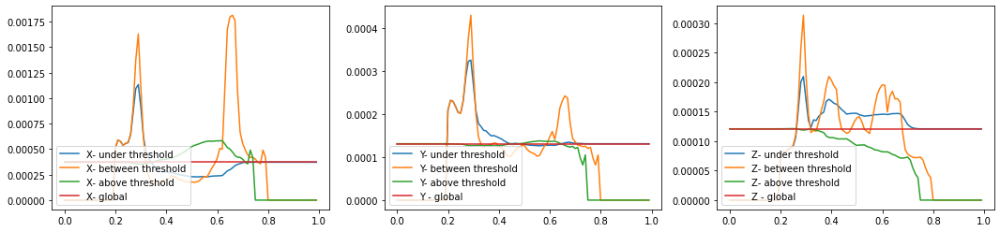

In [18]:

mae_x = [mae_threshold_x_l, mae_threshold_x_b, mae_threshold_x_h]
mae_y = [mae_threshold_y_l, mae_threshold_y_b, mae_threshold_y_h]
mae_z = [mae_threshold_z_l, mae_threshold_z_b, mae_threshold_z_h]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,4))

for i, ax in enumerate(axs.flatten()): 
    if i == 0:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[0], axis = 1), label = "X- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[1], axis = 1), label = "X- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[2], axis = 1), label = "X- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_x_g), label = "X- global")
    elif i == 1:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[0], axis = 1), label = "Y- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[1], axis = 1), label = "Y- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[2], axis = 1), label = "Y- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_y_g), label = "Y - global")
    else:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[0], axis = 1), label = "Z- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[1], axis = 1), label = "Z- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[2], axis = 1), label = "Z- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_z_g), label = "Z - global")

    ax.legend(loc="lower left")

plt.show()


In [19]:
def plot_metrics_for_euc_threshold(metrics_threshold, metrics_global):
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,4))

    for i, ax in enumerate(axs.flatten()):  
        ax.plot(range(ahead), metrics_global[i], label = "global", color='black')
        for threshold in range(5,80,10):
            ax.plot(range(ahead), metrics_threshold[i][threshold], label = str(threshold/100) + "-" + str(threshold/100-0.05))
        ax.legend(loc="upper left")

    plt.show()

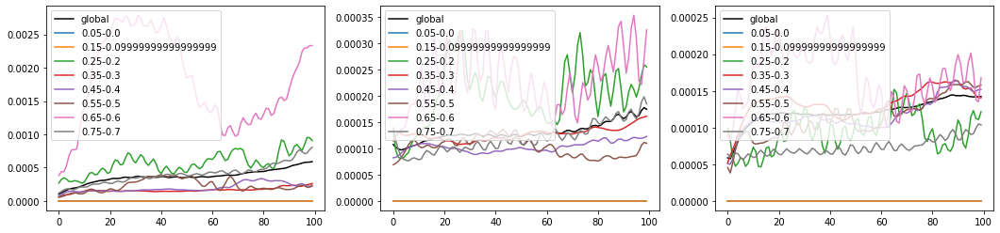

In [20]:
# LOWER THE BETTER
plot_metrics_for_euc_threshold([mae_threshold_x_b,mae_threshold_y_b,mae_threshold_z_b], [mae_x_g, mae_y_g, mae_z_g])

[8378, 2070, 902, 1928, 8284, 10991, 8494, 874, 960, 2046]


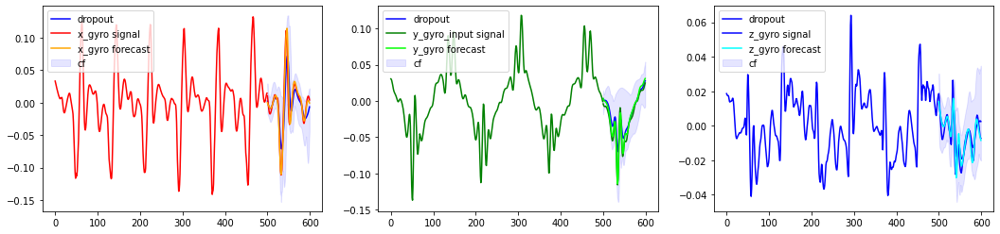

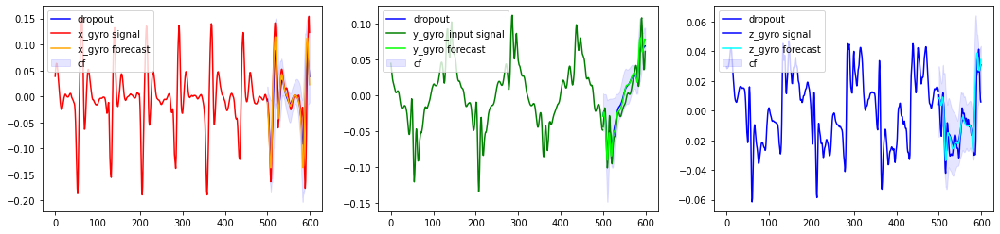

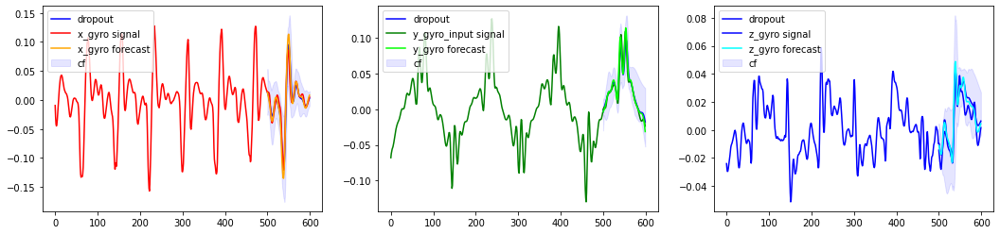

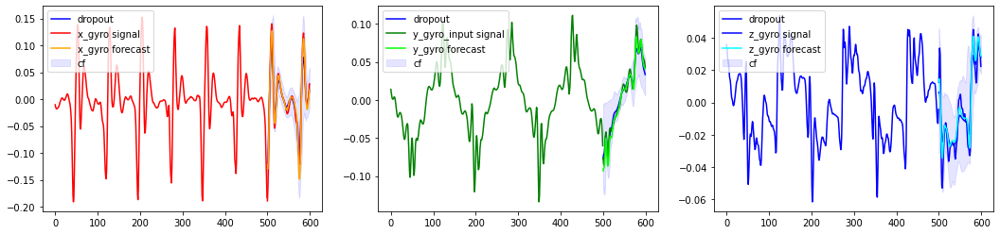

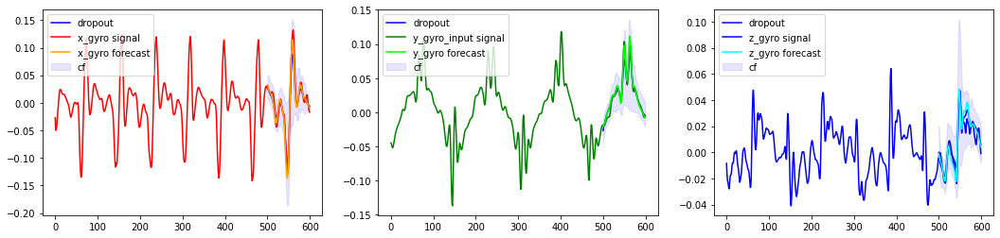

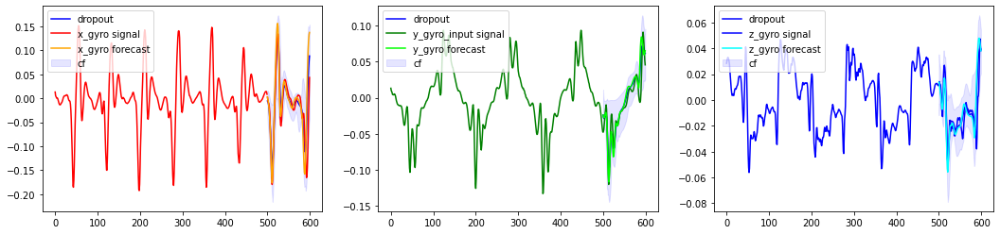

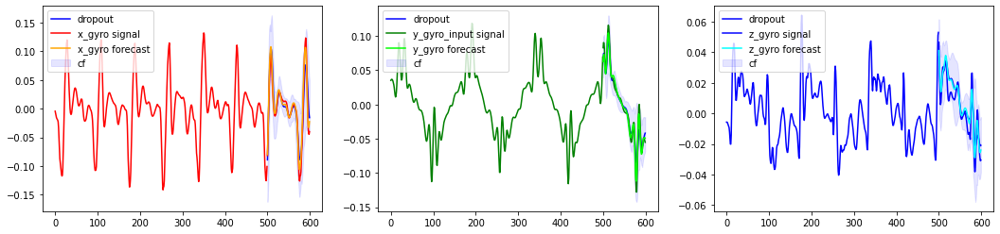

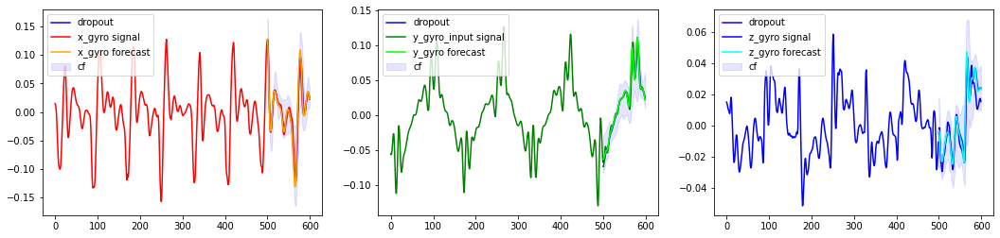

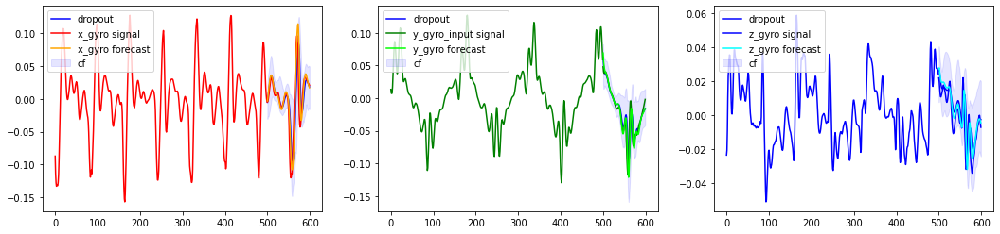

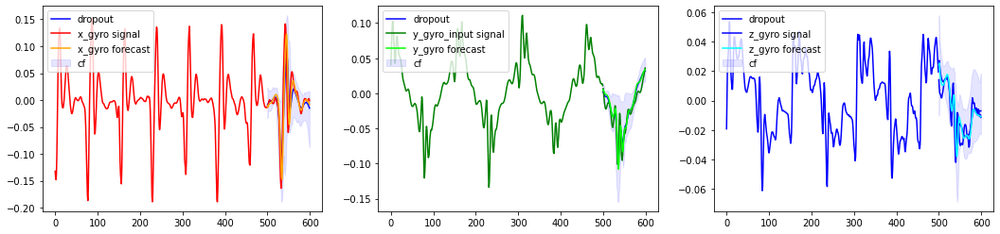

In [40]:
# plot samples where the periodicity metric is between 0.75 and 0.7
threshold  = 0.75
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(x_gyro_acf > threshold - 0.05, x_gyro_acf < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)

[16415, 16379, 4200, 16152, 16237, 16243, 4913, 16410, 4239, 16391]


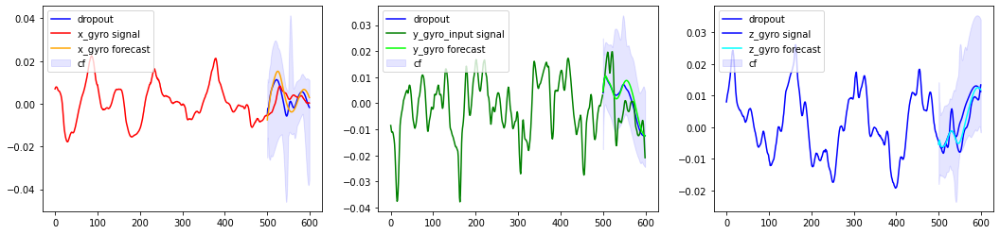

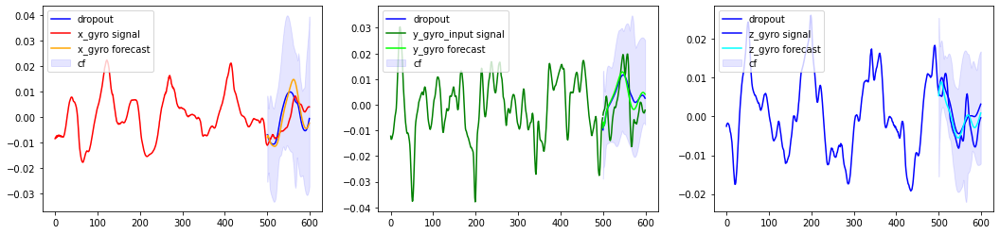

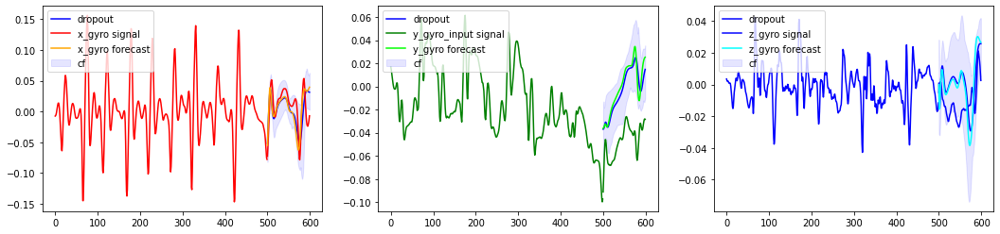

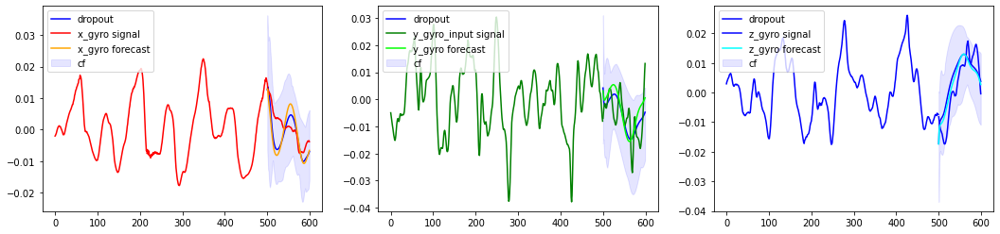

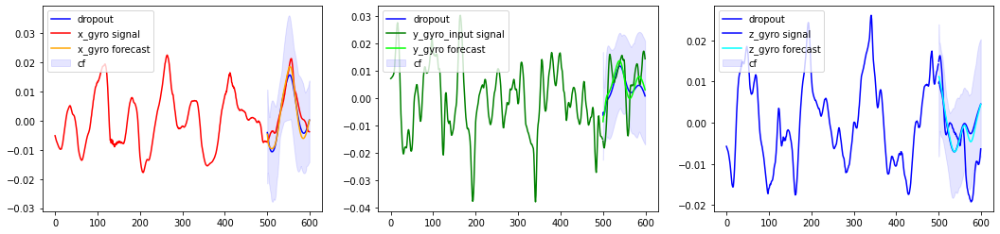

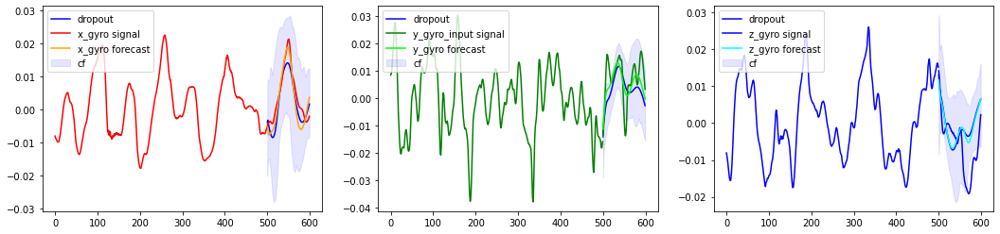

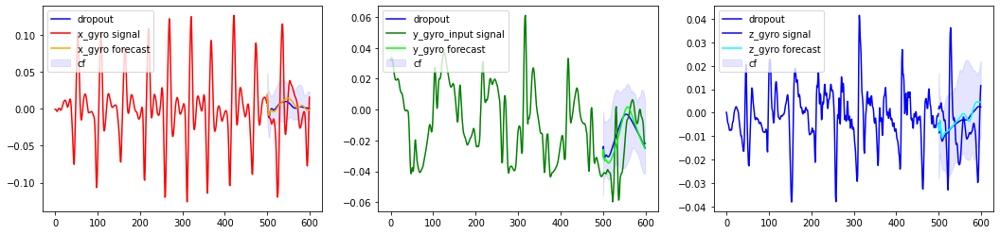

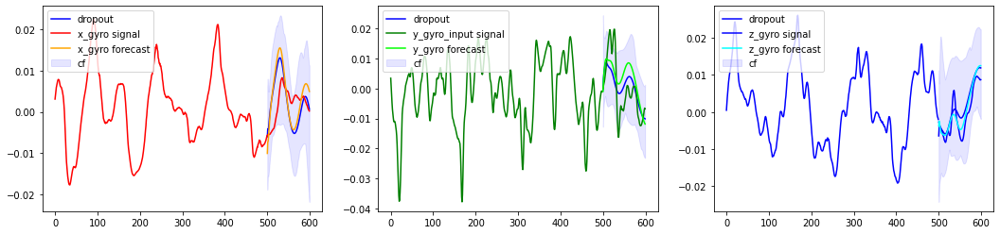

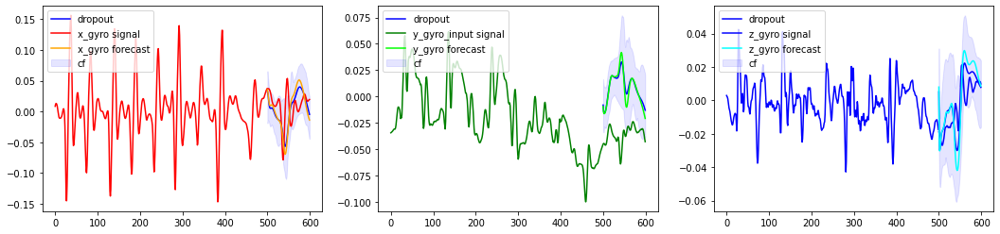

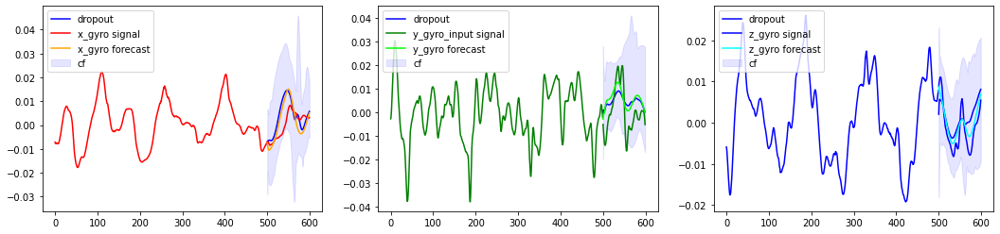

In [41]:
# plot samples where the periodicity metric is between 0.55 and 0.5
threshold  = 0.55
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(x_gyro_acf > threshold - 0.05, x_gyro_acf < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)

[4738, 14875, 13994, 14497, 14557, 12442, 14478, 14130, 3536, 14495]


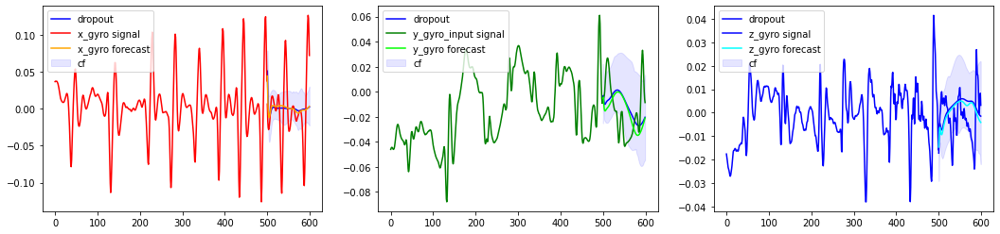

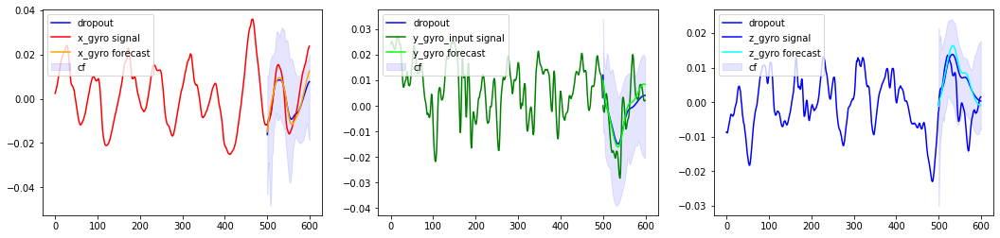

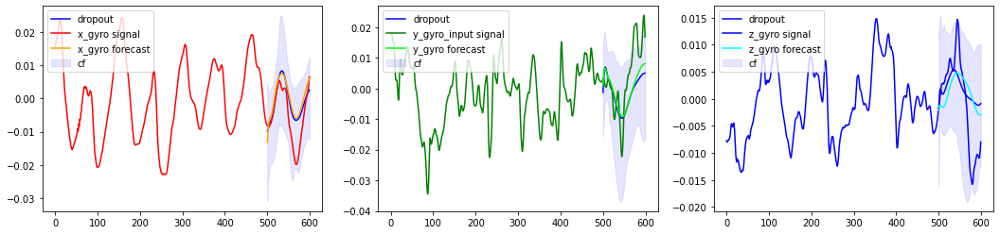

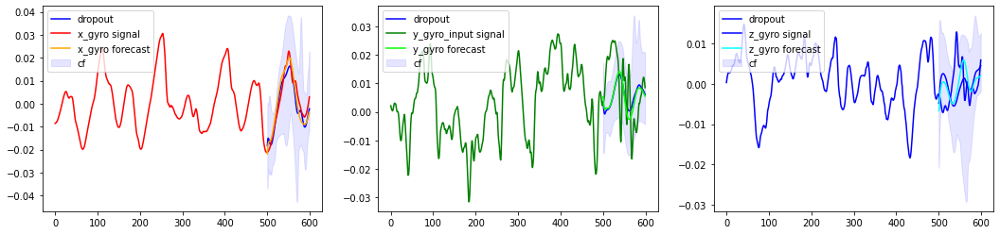

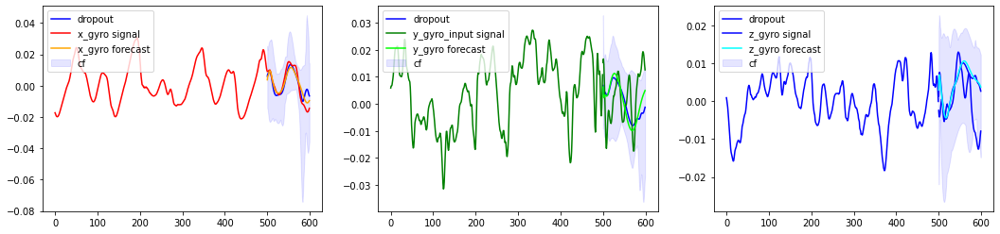

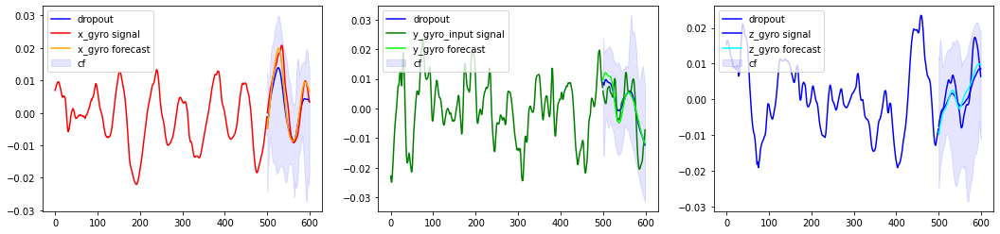

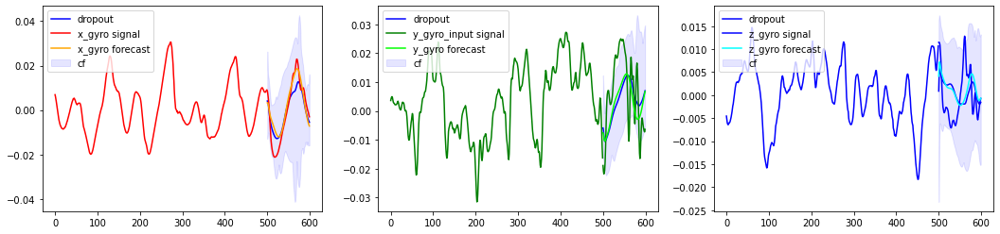

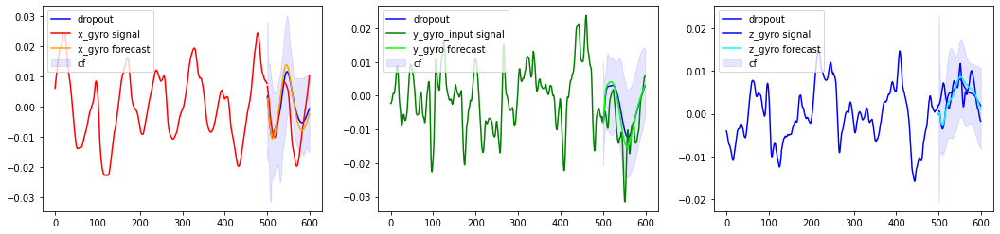

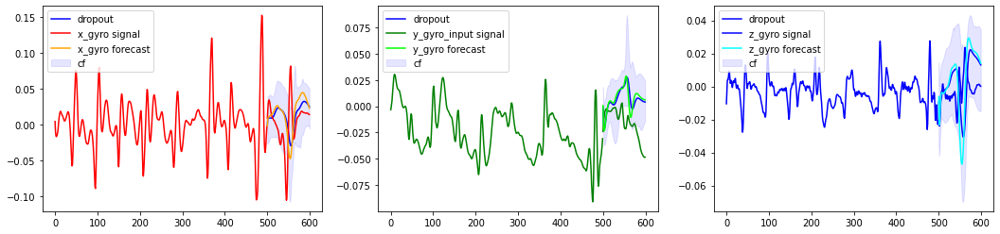

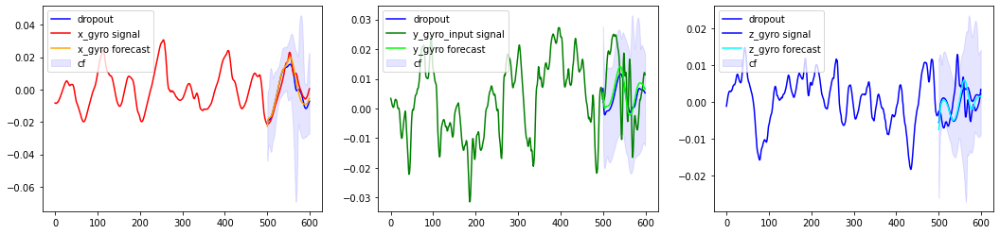

In [42]:
# plot samples where the periodicity metric is between 0.35 and 0.3
threshold  = 0.35
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(x_gyro_acf > threshold - 0.05, x_gyro_acf < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)

In [33]:
# same analysis but only for one axe.
# ONLY ONE AXE ( X) FOR THE PERIODICIY METRIC

values_to_test = 100

mae_threshold_x_l = np.zeros((values_to_test,ahead))
mae_threshold_y_l = np.zeros((values_to_test,ahead))
mae_threshold_z_l = np.zeros((values_to_test,ahead))

mse_threshold_x_l = np.zeros((values_to_test,ahead))
mse_threshold_y_l = np.zeros((values_to_test,ahead))
mse_threshold_z_l = np.zeros((values_to_test,ahead))

mae_threshold_x_b = np.zeros((values_to_test,ahead))
mae_threshold_y_b = np.zeros((values_to_test,ahead))
mae_threshold_z_b = np.zeros((values_to_test,ahead))

mse_threshold_x_b = np.zeros((values_to_test,ahead))
mse_threshold_y_b = np.zeros((values_to_test,ahead))
mse_threshold_z_b = np.zeros((values_to_test,ahead))

mae_threshold_x_h = np.zeros((values_to_test,ahead))
mae_threshold_y_h = np.zeros((values_to_test,ahead))
mae_threshold_z_h = np.zeros((values_to_test,ahead))

mse_threshold_x_h = np.zeros((values_to_test,ahead))
mse_threshold_y_h = np.zeros((values_to_test,ahead))
mse_threshold_z_h = np.zeros((values_to_test,ahead))

mae_x_g = np.zeros((1,ahead))
mae_y_g = np.zeros((1,ahead))
mae_z_g = np.zeros((1,ahead))

mse_x_g = np.zeros((1,ahead))
mse_y_g = np.zeros((1,ahead))
mse_z_g = np.zeros((1,ahead))


x_gyro_acf = acf_peaks_gyro_X_test[:,0]

mae_x, mse_x, mape_x, smape_x = get_metrics_for_forecast(y_test[:,:,0].reshape((-1,ahead)), forecast_x)
mae_y, mse_y, mape_y, smape_y = get_metrics_for_forecast(y_test[:,:,1].reshape((-1,ahead)), forecast_y)
mae_z, mse_z, mape_z, smape_z = get_metrics_for_forecast(y_test[:,:,2].reshape((-1,ahead)), forecast_z)
    
mae_x_g = mae_x
mae_y_g = mae_y
mae_z_g = mae_z

mse_x_g = mse_x
mse_y_g = mse_y
mse_z_g = mse_z


for threshold in range(0,values_to_test,1):

    current_threshold = threshold/100.0

    idx_lower = np.where(x_gyro_acf < current_threshold)[0]
    idx_between = np.where(np.logical_and(x_gyro_acf > current_threshold - 0.05, x_gyro_acf < current_threshold))[0]
    idx_higher = np.where(x_gyro_acf > current_threshold)[0]
    
    if len(idx_lower) > 0:

        mae_low_x, mse_low_x, mape_low_x, smape_low_x = get_metrics_for_forecast(y_test[idx_lower,:,0].reshape((-1,ahead)), forecast_x[idx_lower])
        mae_low_y, mse_low_y, mape_low_y, smape_low_y = get_metrics_for_forecast(y_test[idx_lower,:,1].reshape((-1,ahead)), forecast_y[idx_lower])
        mae_low_z, mse_low_z, mape_low_z, smape_low_z = get_metrics_for_forecast(y_test[idx_lower,:,2].reshape((-1,ahead)), forecast_z[idx_lower])
        
        mae_threshold_x_l[threshold] = mae_low_x
        mae_threshold_y_l[threshold] = mae_low_y
        mae_threshold_z_l[threshold] = mae_low_z

        mse_threshold_x_l[threshold] = mse_low_x
        mse_threshold_y_l[threshold] = mse_low_y
        mse_threshold_z_l[threshold] = mse_low_z

    if len(idx_between) > 0:

        mae_between_x, mse_between_x, mape_between_x, smape_between_x = get_metrics_for_forecast(y_test[idx_between,:,0].reshape((-1,ahead)), forecast_x[idx_between])
        mae_between_y, mse_between_y, mape_between_y, smape_between_y = get_metrics_for_forecast(y_test[idx_between,:,1].reshape((-1,ahead)), forecast_y[idx_between])
        mae_between_z, mse_between_z, mape_between_z, smape_between_z = get_metrics_for_forecast(y_test[idx_between,:,2].reshape((-1,ahead)), forecast_z[idx_between])
        
        mae_threshold_x_b[threshold] = mae_between_x
        mae_threshold_y_b[threshold] = mae_between_y
        mae_threshold_z_b[threshold] = mae_between_z

        mse_threshold_x_b[threshold] = mse_between_x
        mse_threshold_y_b[threshold] = mse_between_y
        mse_threshold_z_b[threshold] = mse_between_z
    
    if len(idx_higher) > 0:
        mae_high_x, mse_high_x, mape_high_x, smape_high_x = get_metrics_for_forecast(y_test[idx_higher,:,0].reshape((-1,ahead)), forecast_x[idx_higher])
        mae_high_y, mse_high_y, mape_high_y, smape_high_y = get_metrics_for_forecast(y_test[idx_higher,:,1].reshape((-1,ahead)), forecast_y[idx_higher])
        mae_high_z, mse_high_z, mape_high_z, smape_high_z = get_metrics_for_forecast(y_test[idx_higher,:,2].reshape((-1,ahead)), forecast_z[idx_higher])
    
        mae_threshold_x_h[threshold] = mae_high_x
        mae_threshold_y_h[threshold] = mae_high_y
        mae_threshold_z_h[threshold] = mae_high_z

        mse_threshold_x_h[threshold] = mse_high_x
        mse_threshold_y_h[threshold] = mse_high_y
        mse_threshold_z_h[threshold] = mse_high_z

    print("THRESHOLD", current_threshold, len(idx_lower), len(idx_higher))

THRESHOLD 0.0 0 17050
THRESHOLD 0.01 0 17050
THRESHOLD 0.02 0 17050
THRESHOLD 0.03 0 17050
THRESHOLD 0.04 0 17050
THRESHOLD 0.05 0 17050
THRESHOLD 0.06 0 17050
THRESHOLD 0.07 0 17050
THRESHOLD 0.08 0 17050
THRESHOLD 0.09 0 17050
THRESHOLD 0.1 0 17050
THRESHOLD 0.11 0 17050
THRESHOLD 0.12 0 17050
THRESHOLD 0.13 0 17050
THRESHOLD 0.14 0 17050
THRESHOLD 0.15 0 17050
THRESHOLD 0.16 0 17050
THRESHOLD 0.17 0 17050
THRESHOLD 0.18 4 17046
THRESHOLD 0.19 22 17028
THRESHOLD 0.2 40 17010
THRESHOLD 0.21 106 16944
THRESHOLD 0.22 161 16889
THRESHOLD 0.23 316 16734
THRESHOLD 0.24 394 16656
THRESHOLD 0.25 433 16617
THRESHOLD 0.26 505 16545
THRESHOLD 0.27 587 16463
THRESHOLD 0.28 679 16371
THRESHOLD 0.29 839 16211
THRESHOLD 0.3 941 16109
THRESHOLD 0.31 1062 15988
THRESHOLD 0.32 1126 15924
THRESHOLD 0.33 1191 15859
THRESHOLD 0.34 1324 15726
THRESHOLD 0.35 1457 15593
THRESHOLD 0.36 1542 15508
THRESHOLD 0.37 1644 15406
THRESHOLD 0.38 1781 15269
THRESHOLD 0.39 2025 15025
THRESHOLD 0.4 2279 14771
THRESHOLD 

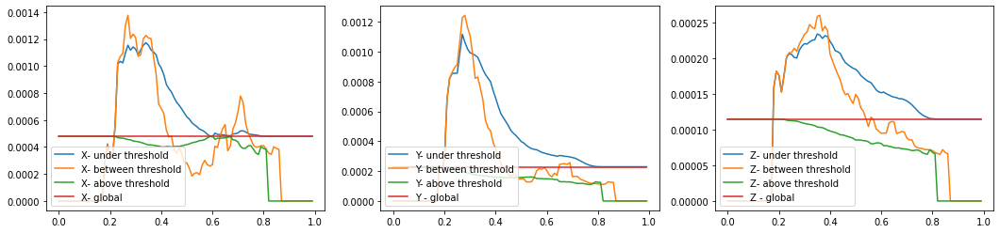

In [34]:
mae_x = [mae_threshold_x_l, mae_threshold_x_b, mae_threshold_x_h]
mae_y = [mae_threshold_y_l, mae_threshold_y_b, mae_threshold_y_h]
mae_z = [mae_threshold_z_l, mae_threshold_z_b, mae_threshold_z_h]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,4))

for i, ax in enumerate(axs.flatten()): 
    if i == 0:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[0], axis = 1), label = "X- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[1], axis = 1), label = "X- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_x[2], axis = 1), label = "X- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_x_g), label = "X- global")
    elif i == 1:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[0], axis = 1), label = "Y- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[1], axis = 1), label = "Y- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_y[2], axis = 1), label = "Y- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_y_g), label = "Y - global")
    else:
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[0], axis = 1), label = "Z- under threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[1], axis = 1), label = "Z- between threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.mean(mae_z[2], axis = 1), label = "Z- above threshold")
        ax.plot(np.arange(0.0,1.0,0.01), np.ones((100))* np.mean(mae_z_g), label = "Z - global")

    ax.legend(loc="lower left")

plt.show()


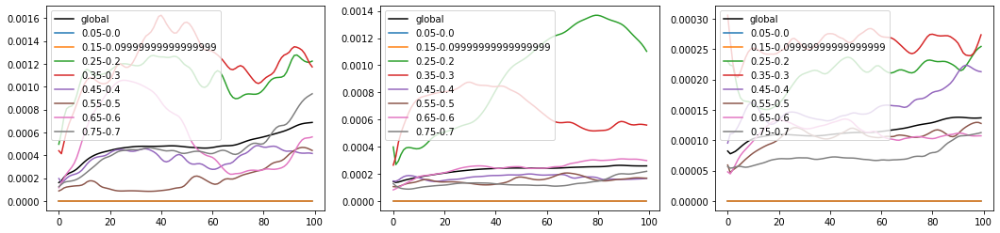

In [35]:
# LOWER THE BETTER
plot_metrics_for_euc_threshold([mae_threshold_x_b,mae_threshold_y_b,mae_threshold_z_b], [mae_x_g, mae_y_g, mae_z_g])

[6000, 7900, 6091, 11743, 514, 5509, 756, 11044, 11708, 10855]


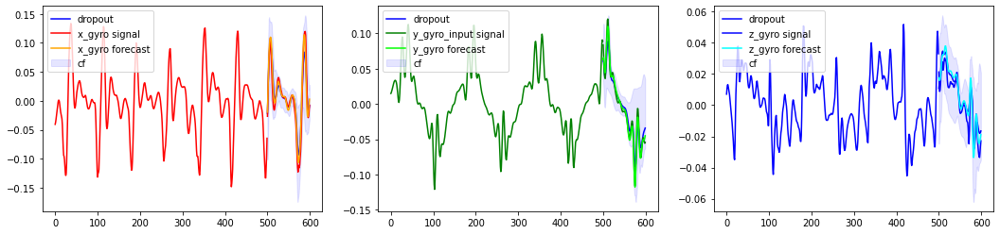

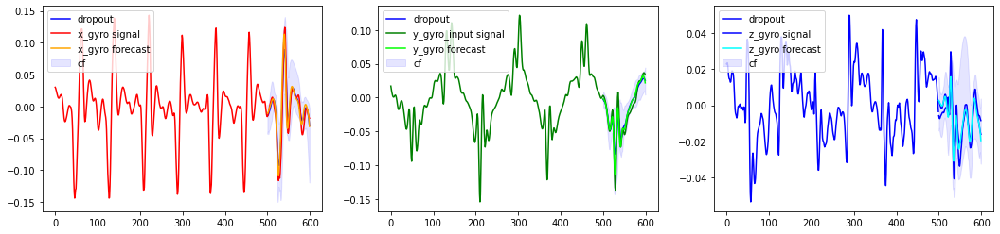

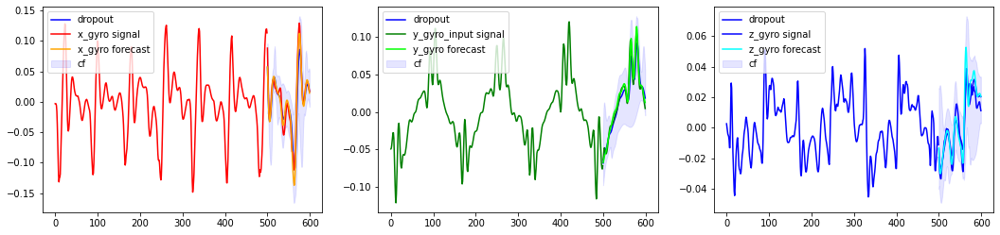

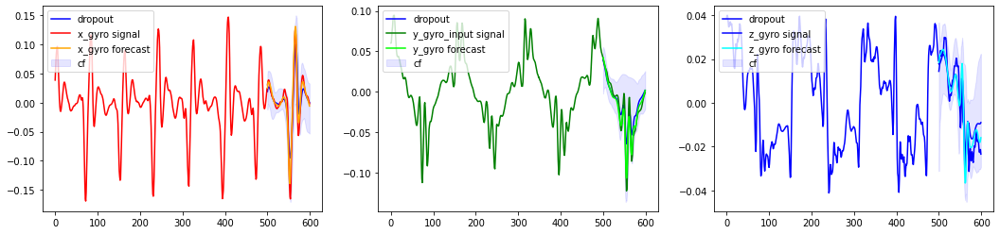

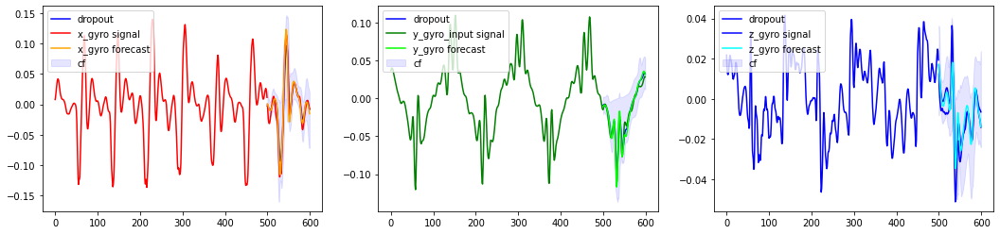

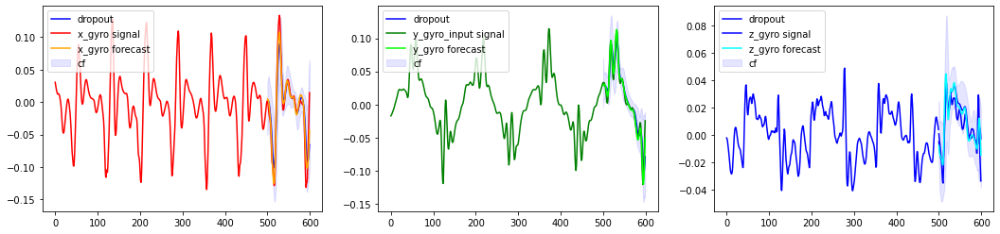

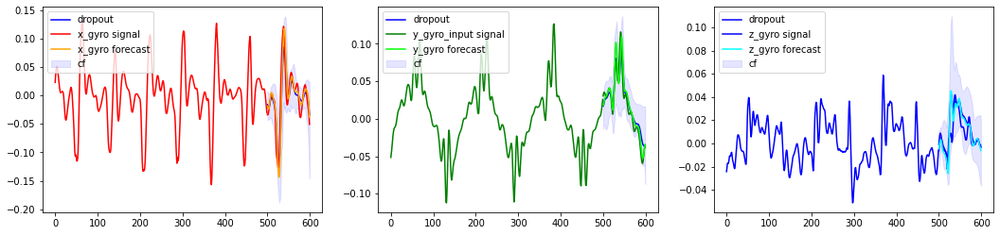

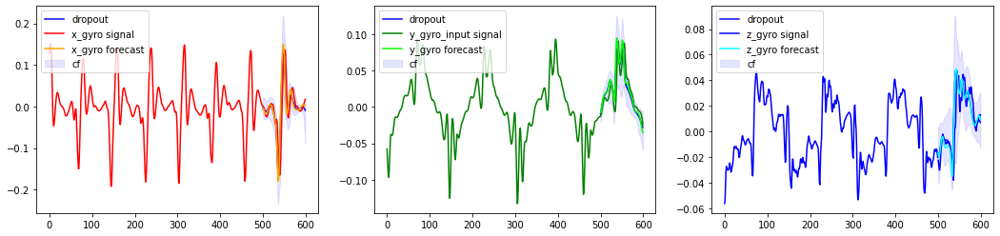

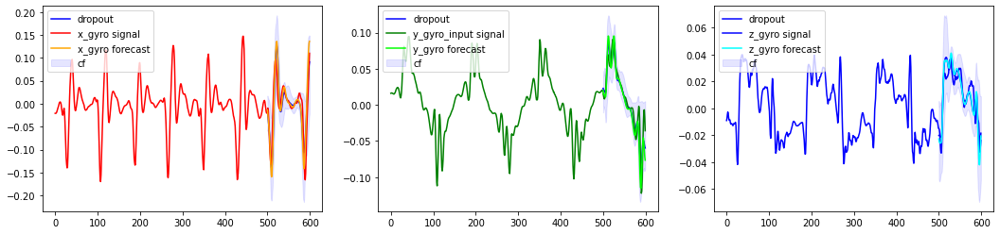

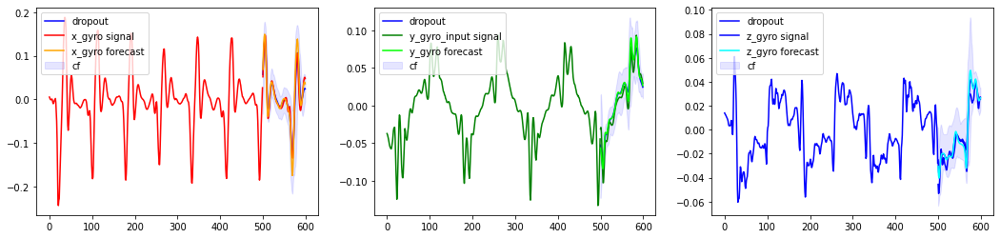

In [36]:
threshold  = 0.75
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(acf_peaks_gyro_X_test[:,0] > threshold - 0.05, acf_peaks_gyro_X_test[:,0] < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)

[14626, 4232, 12992, 2381, 2322, 10572, 14845, 10667, 14335, 14484]


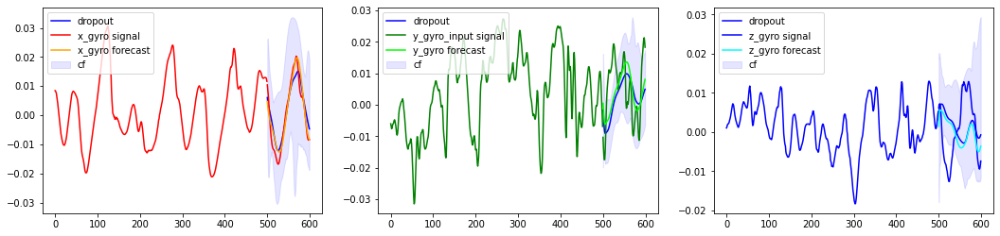

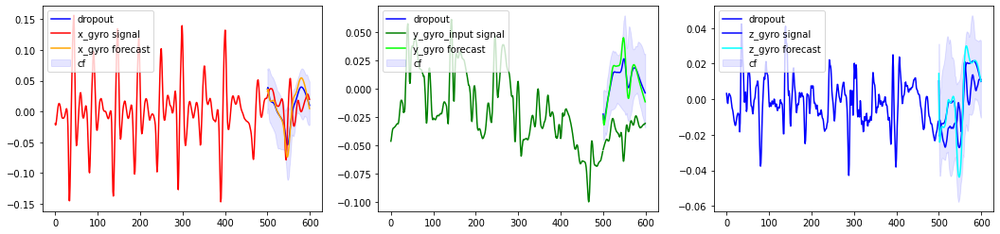

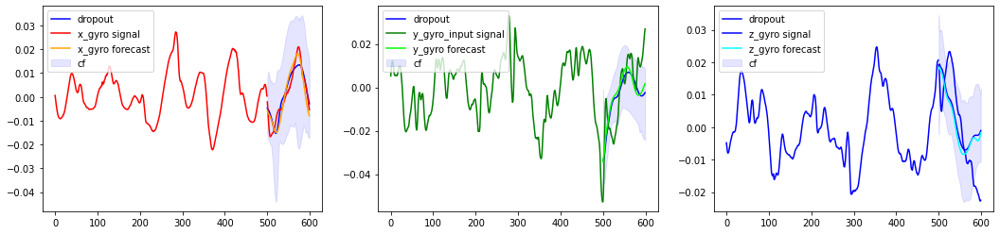

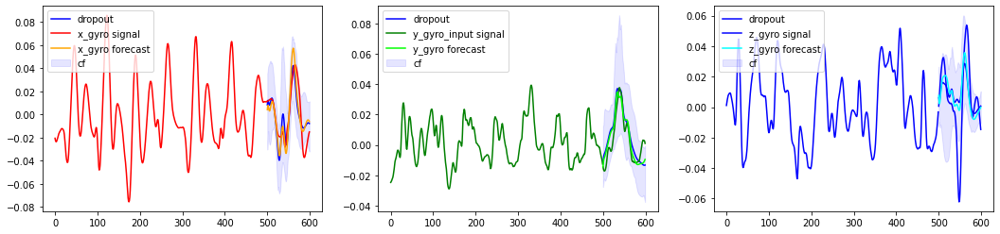

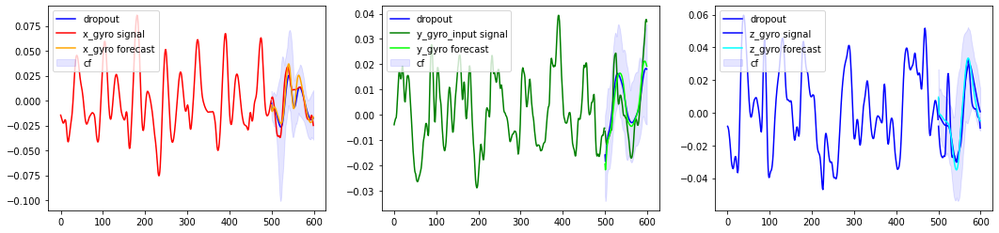

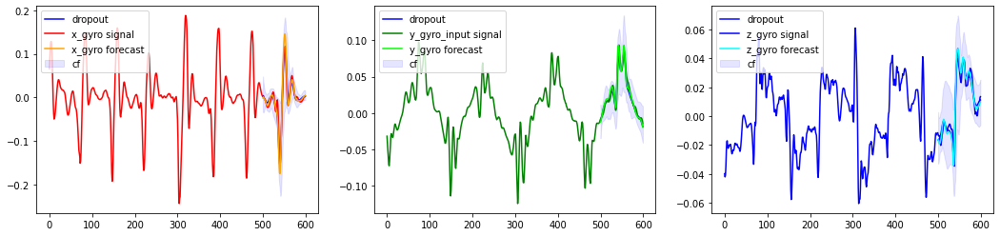

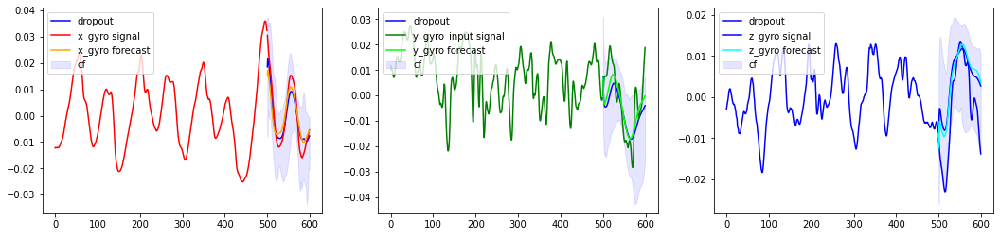

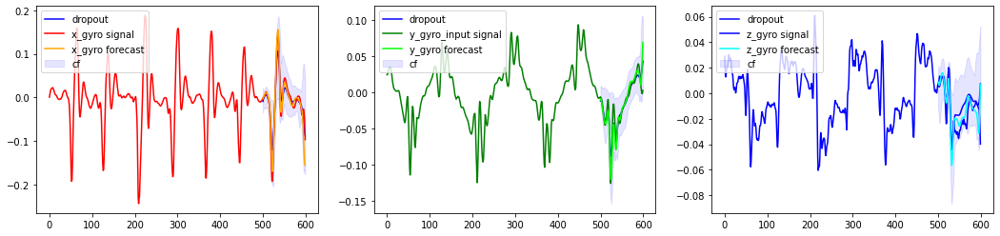

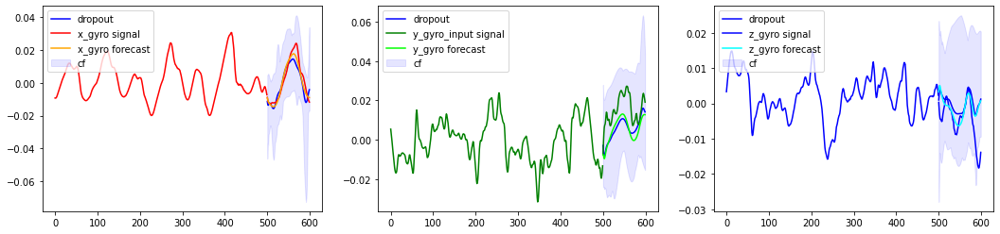

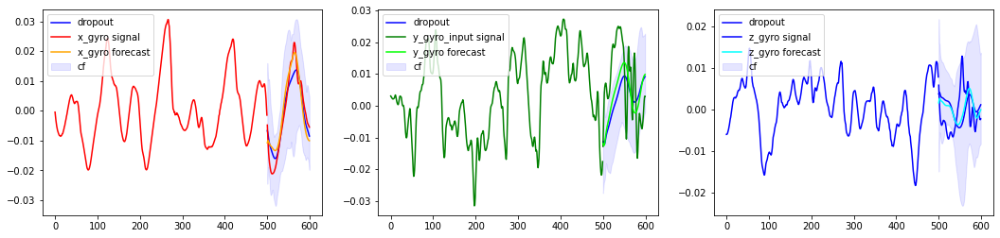

In [37]:
threshold  = 0.55
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(acf_peaks_gyro_X_test[:,0] > threshold - 0.05, acf_peaks_gyro_X_test[:,0] < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)

[4430, 3931, 9977, 5160, 16864, 16773, 9051, 16776, 4426, 3835]


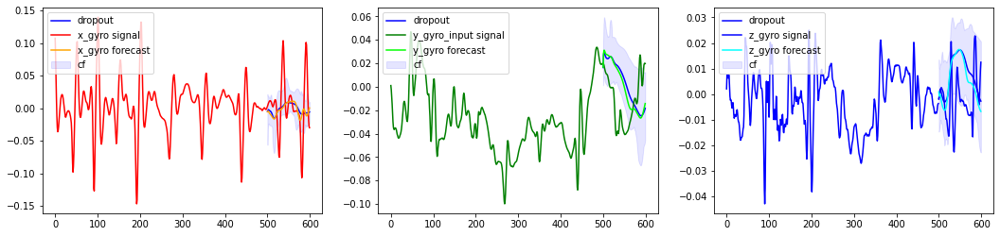

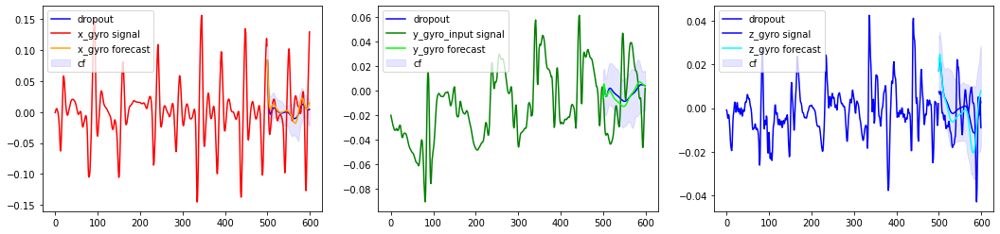

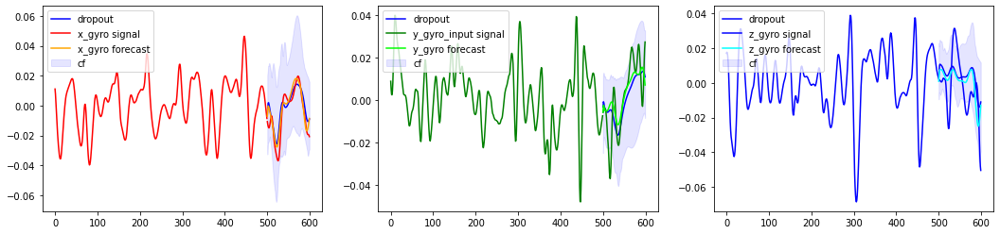

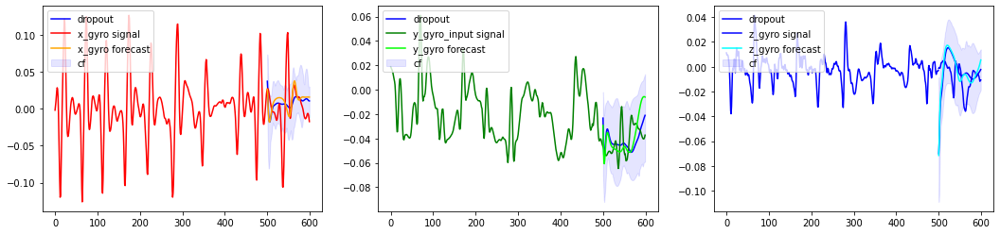

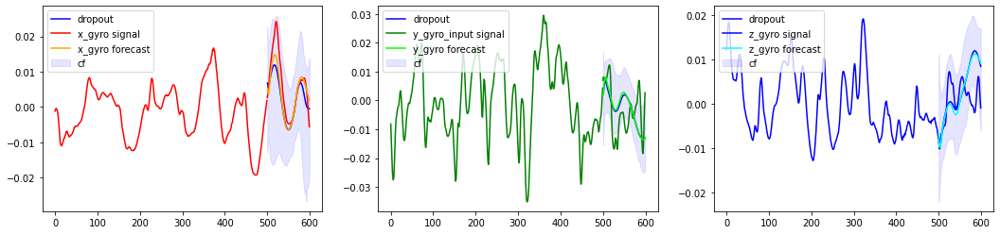

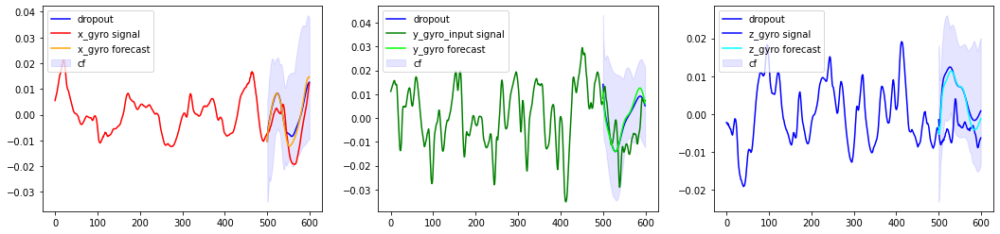

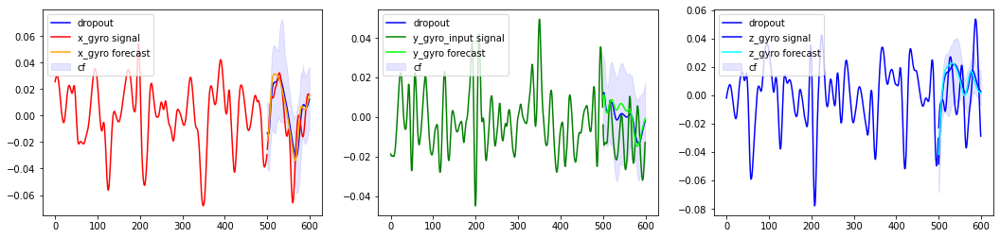

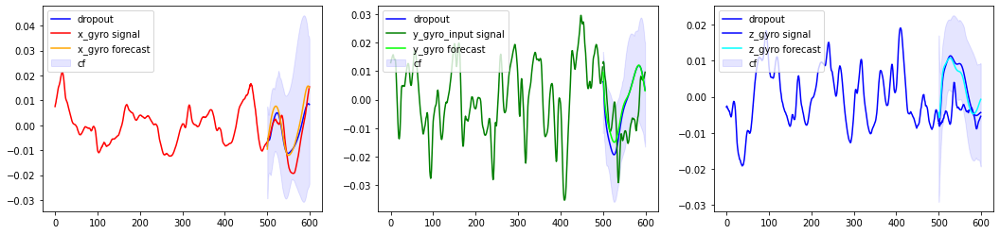

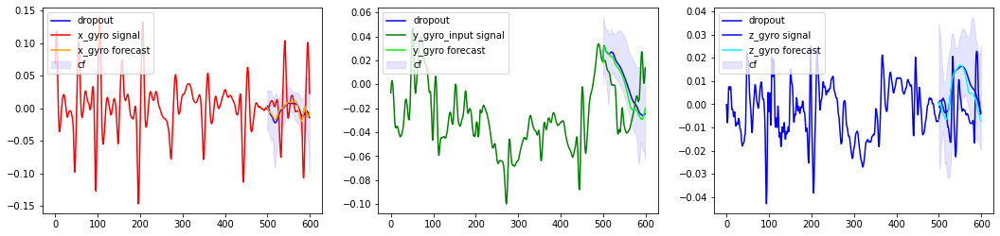

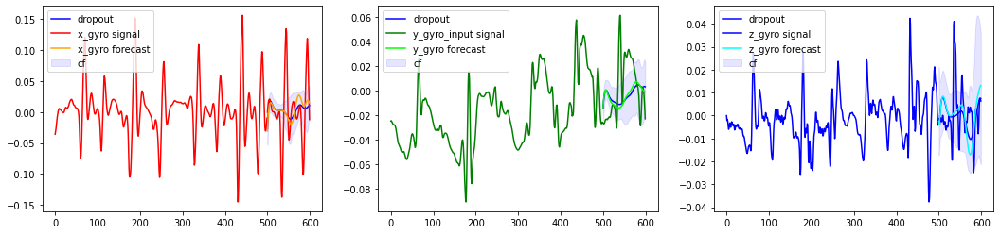

In [38]:
threshold  = 0.35
bad_indexes = np.zeros((X_test.shape[0]))

idx_between = np.where(np.logical_and(acf_peaks_gyro_X_test[:,0] > threshold - 0.05, acf_peaks_gyro_X_test[:,0] < threshold))[0]

bad_indexes[idx_between] = 1
k = 10
plot_examples_test(list(np.where(bad_indexes==1)[0]), X_test, y_test, forecast, k)